In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('../data/UnknownKinaseMotif.txt', sep='\t')
df

,KIN_ACC_ID,SUB_ACC_ID,score,Family,GENE,UP_POS,+/-7AA
0,Q5S007,A0A0A6YYL3,307,LRRK,LRRK2,365,NSQPEKMSQEPEINK
1,Q5S007,A0A0A6YYL3,307,LRRK,LRRK2,490,EDLLRENSMLREEIA
2,O43318,A0AUZ9,540,MLK,MAP3K7,756,LSRIQNSSRNTARRR
3,O14578,A0AV96,270,DMPK,CIT,453,IPAIGAQYSMFPAAP
4,O14578,A0AV96,270,DMPK,CIT,519,PFQGRPITPVYTVAP
...,...,...,...,...,...,...,...
66377,P49841,Q9Y6Y0,270,GSK,GSK3B,330,PQSSPTSTPKLSKSL
66378,P49841,Q9Y6Y0,270,GSK,GSK3B,336,STPKLSKSLSFEMQQ
66379,P49841,Q9Y6Y0,270,GSK,GSK3B,338,PKLSKSLSFEMQQDE
66380,P49841,Q9Y6Y0,270,GSK,GSK3B,352,ELIEKPMSPMQYARS


In [4]:
df[['Family', '+/-7AA']].head()

,Family,+/-7AA
0,LRRK,NSQPEKMSQEPEINK
1,LRRK,EDLLRENSMLREEIA
2,MLK,LSRIQNSSRNTARRR
3,DMPK,IPAIGAQYSMFPAAP
4,DMPK,PFQGRPITPVYTVAP


In [7]:
df['+/-7AA'].isna().sum()

597

In [8]:
len(df)

66382

In [9]:
df.dropna(subset=['+/-7AA'], inplace=True)

In [10]:
df['+/-7AA'].apply(lambda x: len(x))

0        15
1        15
2        15
3        15
4        15
         ..
66377    15
66378    15
66379    15
66380    15
66381    15
Name: +/-7AA, Length: 65785, dtype: int64

In [11]:
df['length_of_sequence'] = df['+/-7AA'].apply(lambda x: len(x))

In [12]:
df[df['length_of_sequence'] != 15]

,KIN_ACC_ID,SUB_ACC_ID,score,Family,GENE,UP_POS,+/-7AA,length_of_sequence
55,O76039,A0MZ66,367,CDKL,CDKL5,629,NVRETDSSNC,10
75,P12931,A1KZ92,298,Src,SRC,1459,DRGMPSDSPEKR,12
91,Q13627,A1L170,270,DYRK,DYRK1A,270,GPHPDLLSFE,10
292,Q13233,A6NI79,270,STE11,MAP3K1,292,PVTPTEVSFLAT,12
492,P57059,B0I1T2,264,CAMKL,SIK1,1012,RCARGSFTLLWPSR,14
...,...,...,...,...,...,...,...,...
66079,P00533,Q9Y6E2,183,EGFR,EGFR,414,NAEEESESEGEEN,13
66116,Q5S007,Q9Y6G9,270,LRRK,LRRK2,518,PTTPTSPTEGEAS,13
66236,O60885,Q9Y6M5,151,BRD,BRD4,505,MPNKQPESSL,10
66237,O60885,Q9Y6M5,151,BRD,BRD4,506,PNKQPESSL,9


In [13]:
df[df['length_of_sequence'] == 15]

,KIN_ACC_ID,SUB_ACC_ID,score,Family,GENE,UP_POS,+/-7AA,length_of_sequence
0,Q5S007,A0A0A6YYL3,307,LRRK,LRRK2,365,NSQPEKMSQEPEINK,15
1,Q5S007,A0A0A6YYL3,307,LRRK,LRRK2,490,EDLLRENSMLREEIA,15
2,O43318,A0AUZ9,540,MLK,MAP3K7,756,LSRIQNSSRNTARRR,15
3,O14578,A0AV96,270,DMPK,CIT,453,IPAIGAQYSMFPAAP,15
4,O14578,A0AV96,270,DMPK,CIT,519,PFQGRPITPVYTVAP,15
...,...,...,...,...,...,...,...,...
66377,P49841,Q9Y6Y0,270,GSK,GSK3B,330,PQSSPTSTPKLSKSL,15
66378,P49841,Q9Y6Y0,270,GSK,GSK3B,336,STPKLSKSLSFEMQQ,15
66379,P49841,Q9Y6Y0,270,GSK,GSK3B,338,PKLSKSLSFEMQQDE,15
66380,P49841,Q9Y6Y0,270,GSK,GSK3B,352,ELIEKPMSPMQYARS,15


In [14]:
df =df[df['length_of_sequence'] == 15]

In [15]:
df['Family'].value_counts()

LRRK    6126
CDK     4244
DMPK    4101
EGFR    2833
PIKK    2534
        ... 
ABC1      15
MOS       15
Lmr       10
TSSK       6
KIS        4
Name: Family, Length: 97, dtype: int64

In [16]:
df['+/-7AA'].value_counts()

MPKFKMPSFGVSAPG    16
ELAKHAVSEGTKAVT    14
KAMGIMNSFVNDIFE    14
VHPDTGISSKAMGIM    14
ITSREIQTAVRLLLP    13
                   ..
RGPGAPASPSASHPQ     1
PGAPASPSASHPQGL     1
APASPSASHPQGLDT     1
GGVCRTRTMKIIMKV     1
IVGGSDPYGQKGLKN     1
Name: +/-7AA, Length: 63230, dtype: int64

In [17]:
df['Family'].nunique()

97

In [18]:
# !pip install logomaker 

In [19]:
df.groupby('Family')['+/-7AA'].apply(list)

Family
ABC1     [GIQDRVLYVLKLYDK, KIDPEKLSVNSHFMK, ATFTRGRSINL...
ALK      [DSMDMDMSPLRPQNY, SPLRPQNYLFGCELK, QLSLRTVSLGA...
Abl      [RGRSKRSSDPSPAGD, APAKGNKSPSPPDGS, AKGNKSPSPPD...
Akt      [ESDARSESPQPAPDW, REDNDLDSQVSQEGL, NDLDSQVSQEG...
Alpha    [QKCRTSGSVYITLKK, CRTSGSVYITLKKYD, LKKYDGRTKPI...
                               ...                        
ULK      [EPIGARLSLEAPGPA, RRRCRARSFSLPADP, RCRARSFSLPA...
VEGFR    [GMSERNLSALENYNF, NLSALENYNFELVDG, ARQGAGFSLRY...
VRK      [LGFLCDCTVLVGDAR, SDQALDLSLKSGPRQ, ALDLSLKSGPR...
WEE      [EPSSRSGSPDREGRA, LQKILENTVPDASAY, PVLQRAVSALQ...
WNK      [EASRCRLSPSGDSVF, LSRWQNRTMENLVEL, TRNKVRKTFVG...
Name: +/-7AA, Length: 97, dtype: object

c:\Users\sadia\anaconda3\lib\site-packages\logomaker\src\Logo.py:194: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize=self.figsize)


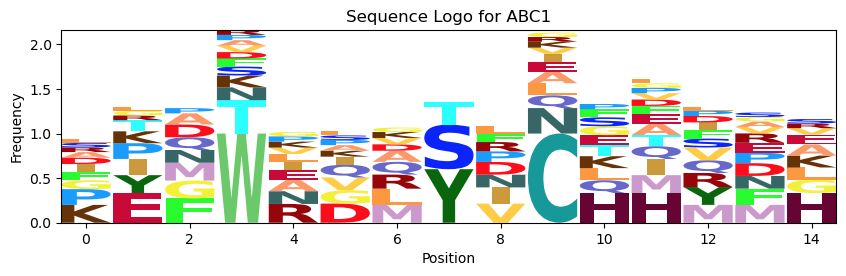

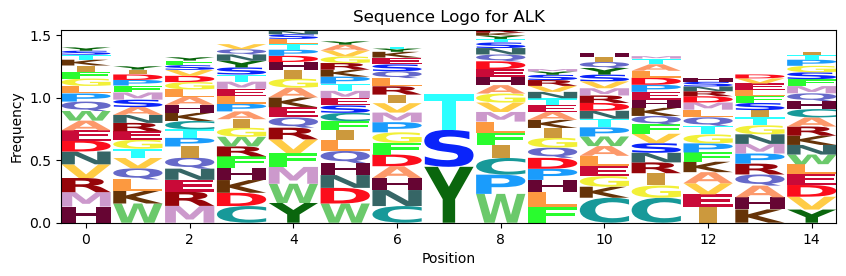

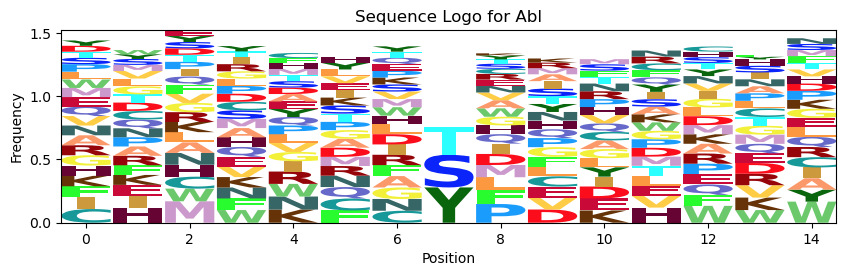

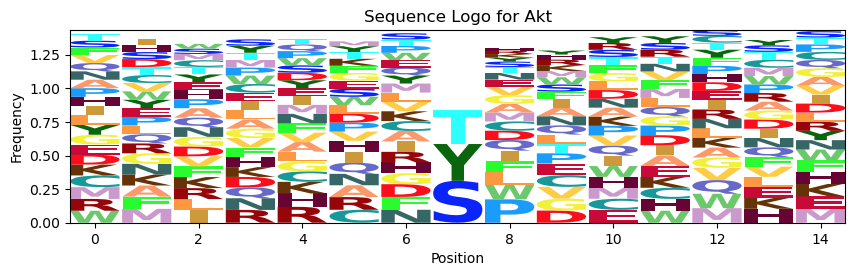

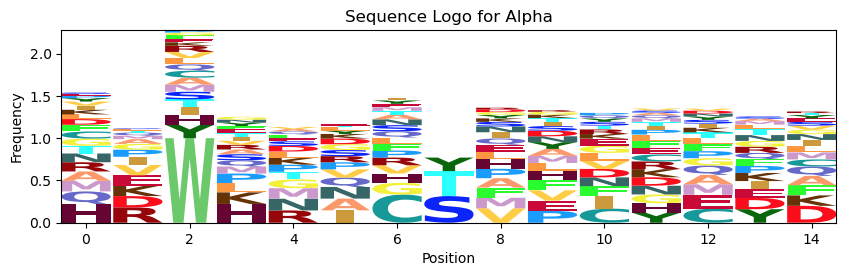

...

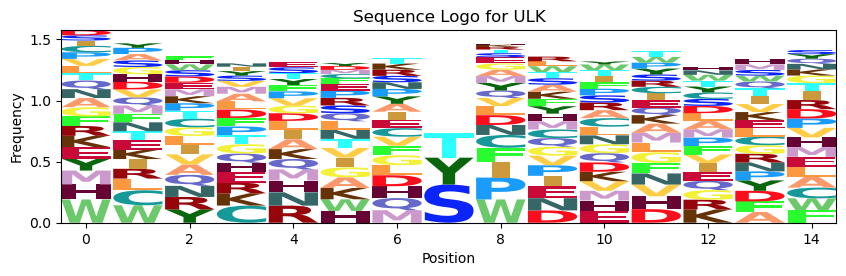

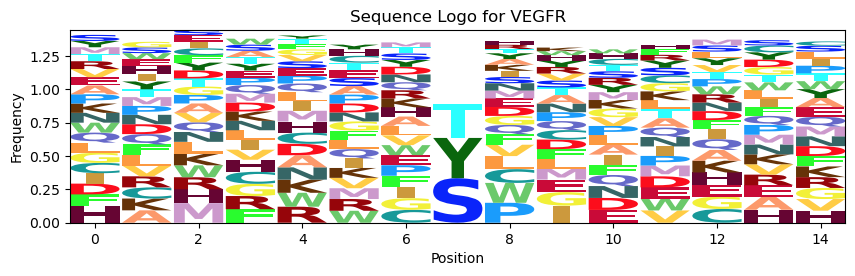

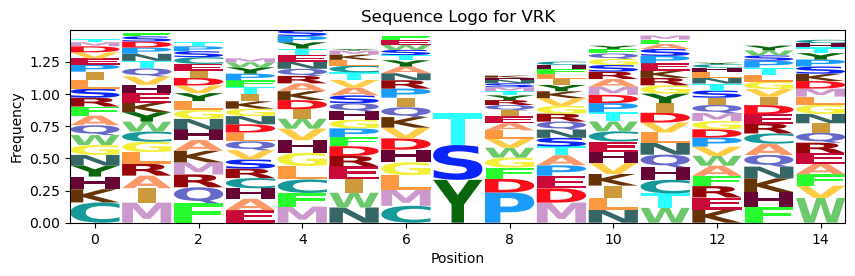

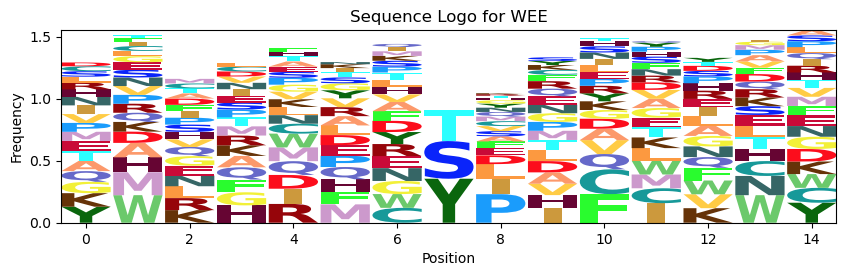

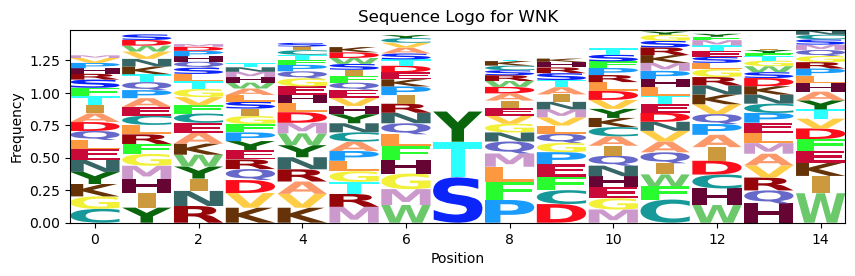

In [20]:
import logomaker
from collections import Counter

# Group by 'KINASE_psp' and combine all sequences into a list
kinase_sequences = df.groupby('Family')['+/-7AA'].apply(list)

# Initialize an empty dictionary to store the Logos for each kinase
kinase_logos = {}

# For each kinase, create a position frequency matrix and then a sequence logo
for kinase, sequences in kinase_sequences.items():
    # Combine sequences into a single string for each position
    try: 
        # remove nan from the sequence list 
        sequences = [seq for seq in sequences if isinstance(seq, str)]
        aligned_sequences = [''.join(seq) for seq in zip(*sequences)]
    except:
        print(f"Error with {kinase} the sequence is {sequences}")
        continue
    
    # Create a DataFrame where each row corresponds to one position
    position_df = pd.DataFrame([Counter(pos) for pos in aligned_sequences]).fillna(0)
    
    # Normalize the counts to get frequencies
    position_freq_matrix = position_df.div(position_df.sum(axis=0), axis=1)
    
    # Create the sequence logo
    logo = logomaker.Logo(position_freq_matrix, color_scheme='skylign_protein', stack_order='small_on_top')
    
    # Set title and axis labels
    logo.ax.set_title(f'Sequence Logo for {kinase}')
    logo.ax.set_xlabel('Position')
    logo.ax.set_ylabel('Frequency')
    
    # Store the logo in the dictionary
    kinase_logos[kinase] = logo

